In [ ]:
import tensorflow as tf
import os
print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

2.15.0
Mounted at /content/drive


In [ ]:
!mkdir video_test
%cd video_test
!unrar x '/content/drive/MyDrive/video test.rar'
%cd /content/

mkdir: cannot create directory ‘video_test’: File exists
/content/video_test

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/video test.rar

Creating    video test                                                OK
Extracting  video test/armin_print.mp4                                     1%  2%  3%  4%  5%  6%  7%  8%  9% 10% 11% 12% 13% 14% 15%  OK 
Extracting  video test/armin_real.mp4                                     16% 17% 18% 19% 20% 21% 22% 23% 24% 25%  OK 
Extracting  video test/armin_screen.mp4                                   26% 27% 28% 29% 30% 31% 32% 33% 34% 35% 36% 37% 38%  OK 
Extracting  video test/china_print_1.avi                                  39%  OK 
Extracting  video test/china_print_2.avi                               

In [ ]:
import os
import cv2
import numpy as np  # Ensure numpy is correctly imported
import pandas as pd
from numpy.fft import fft2, fftshift  # Explicitly import FFT functions
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import StandardScaler


CNN

In [ ]:
# Directory containing the videos
video_dir = '/content/video_test/video test'

# Dictionary to store the middle frames
middle_frames = {}

# List all video files in the directory
video_files = [f for f in os.listdir(video_dir) if os.path.isfile(os.path.join(video_dir, f)) and (f.endswith('.mp4') or f.endswith('.avi'))]
print(f"Found {len(video_files)} video files.")

for video_file in video_files:
    print(f"Processing video file: {video_file}")
    video_path = os.path.join(video_dir, video_file)

    # Capture the video
    cap = cv2.VideoCapture(video_path)

    # Check if video opened successfully
    if not cap.isOpened():
        print(f"Error opening video file: {video_file}")
        continue

    # Get total number of frames
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video {video_file}: {total_frames}")

    # Calculate the middle frame index
    if total_frames > 0:
        middle_frame_idx = total_frames // 2
    else:
        print(f"Skipping video {video_file} due to zero frames.")
        continue

    # Set the video to the middle frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame_idx)

    # Read the middle frame
    ret, frame = cap.read()

    if ret:
        # Store the frame in the dictionary
        middle_frames[video_file] = frame
        print(f"Middle frame extracted for video {video_file}")
    else:
        print(f"Could not read frame from {video_file}")

    # Release the video capture object
    cap.release()

Found 13 video files.
Processing video file: woman_real.mp4
Total frames in video woman_real.mp4: 51
Middle frame extracted for video woman_real.mp4
Processing video file: china_print_1.avi
Total frames in video china_print_1.avi: 217
Middle frame extracted for video china_print_1.avi
Processing video file: farzam_screen.mp4
Total frames in video farzam_screen.mp4: 326
Middle frame extracted for video farzam_screen.mp4
Processing video file: armin_screen.mp4
Total frames in video armin_screen.mp4: 187
Middle frame extracted for video armin_screen.mp4
Processing video file: woman_monitor.mp4
Total frames in video woman_monitor.mp4: 36
Middle frame extracted for video woman_monitor.mp4
Processing video file: china_real_1.avi
Total frames in video china_real_1.avi: 158
Middle frame extracted for video china_real_1.avi
Processing video file: woman_print.mp4
Total frames in video woman_print.mp4: 37
Middle frame extracted for video woman_print.mp4
Processing video file: china_real_2.avi
Tot

In [ ]:
# Check the dictionary
print(f"Total videos processed: {len(middle_frames)}")
for video_name, frame in middle_frames.items():
    print(f"Video: {video_name}, Frame shape: {frame.shape}")

Total videos processed: 13
Video: woman_real.mp4, Frame shape: (1920, 1080, 3)
Video: china_print_1.avi, Frame shape: (480, 640, 3)
Video: farzam_screen.mp4, Frame shape: (1920, 1080, 3)
Video: armin_screen.mp4, Frame shape: (1920, 1080, 3)
Video: woman_monitor.mp4, Frame shape: (1920, 1080, 3)
Video: china_real_1.avi, Frame shape: (1280, 720, 3)
Video: woman_print.mp4, Frame shape: (1920, 1080, 3)
Video: china_real_2.avi, Frame shape: (480, 640, 3)
Video: armin_real.mp4, Frame shape: (1920, 1080, 3)
Video: armin_print.mp4, Frame shape: (1920, 1080, 3)
Video: farzam_print.mp4, Frame shape: (1920, 1080, 3)
Video: farzam_real.mp4, Frame shape: (1920, 1080, 3)
Video: china_print_2.avi, Frame shape: (640, 480, 3)


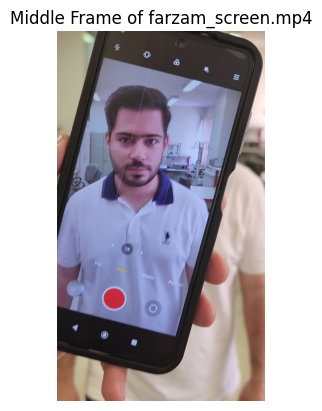

In [ ]:
first_video_name = list(middle_frames.keys())[2]
first_frame = middle_frames[first_video_name]

plt.imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
plt.title(f"Middle Frame of {first_video_name}")
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
import cv2
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern

# Load the trained model
model = load_model('/content/drive/MyDrive/model_1_Final.h5')
model.load_weights('/content/drive/MyDrive/weights_1_Final.h5')

In [ ]:
# Image preprocessing parameters
img_height, img_width = 128, 128

# Prepare the test data
test_data = []
video_names = []

for video_name, frame in middle_frames.items():
    # Resize the frame
    image = cv2.resize(frame, (img_height, img_width))
    # Convert the image to array
    image = img_to_array(image)
    # Normalize the pixel values to [0, 1]
    image = image.astype("float32") / 255.0
    test_data.append(image)
    video_names.append(video_name)

# Convert test data to numpy array
test_data = np.array(test_data, dtype="float32")

# Make predictions
predictions = model.predict(test_data)

# Interpret the predictions
for video_name, prediction in zip(video_names, predictions):
    label = "Spoof" if prediction[0] > 0.5 else "Real"
    print(f"Video: {video_name}, Prediction: {label} ({prediction[0]:.2f})")

1/1 [==============================] - 0s 19ms/step
Video: woman_real.mp4, Prediction: Spoof (1.00)
Video: china_print_1.avi, Prediction: Real (0.00)
Video: farzam_screen.mp4, Prediction: Real (0.00)
Video: armin_screen.mp4, Prediction: Real (0.02)
Video: woman_monitor.mp4, Prediction: Spoof (1.00)
Video: china_real_1.avi, Prediction: Spoof (1.00)
Video: woman_print.mp4, Prediction: Real (0.00)
Video: china_real_2.avi, Prediction: Real (0.00)
Video: armin_real.mp4, Prediction: Spoof (0.96)
Video: armin_print.mp4, Prediction: Spoof (1.00)
Video: farzam_print.mp4, Prediction: Spoof (0.67)
Video: farzam_real.mp4, Prediction: Real (0.00)
Video: china_print_2.avi, Prediction: Spoof (0.63)


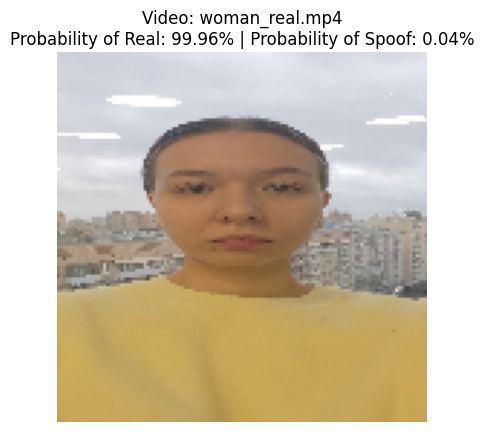

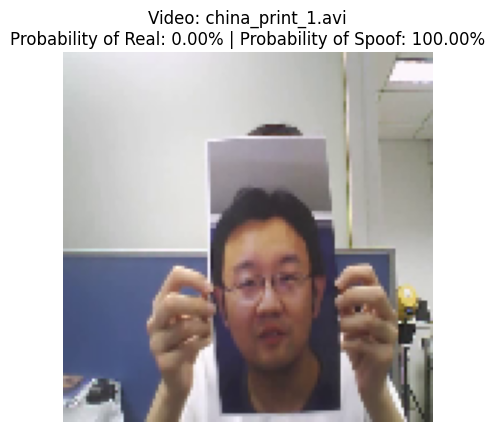

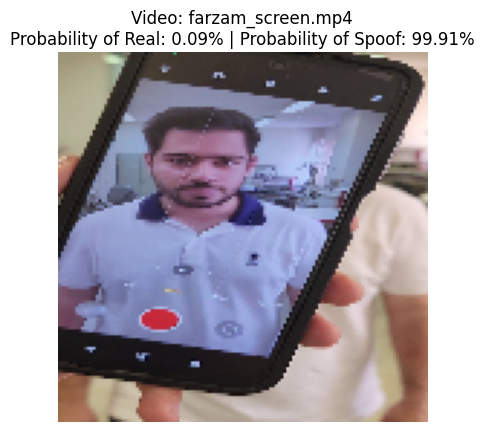

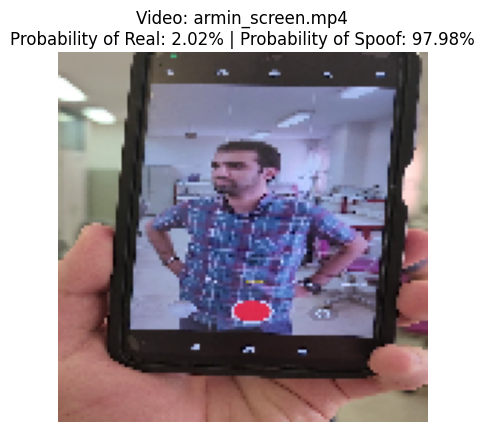

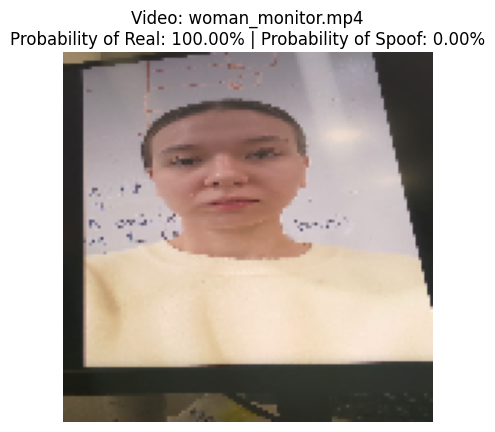

...

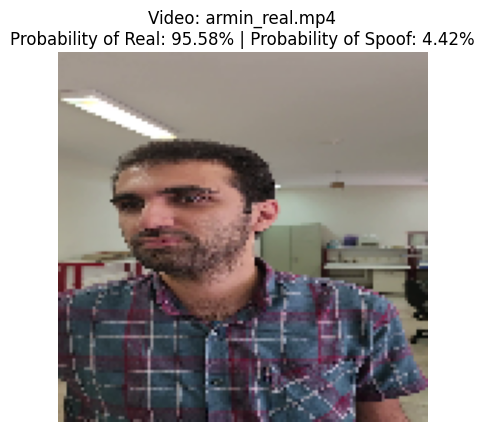

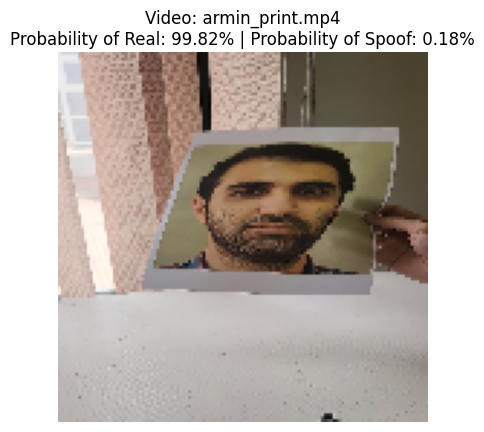

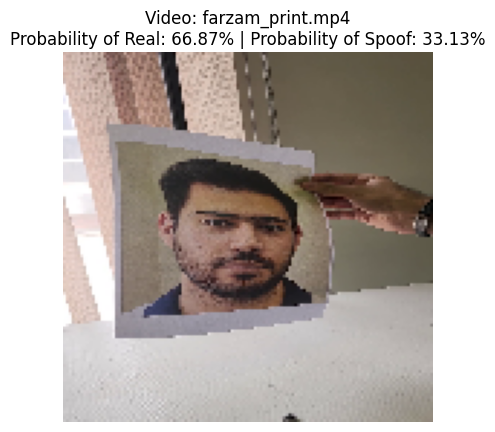

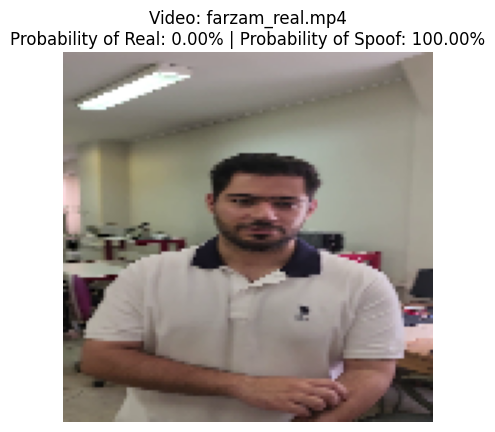

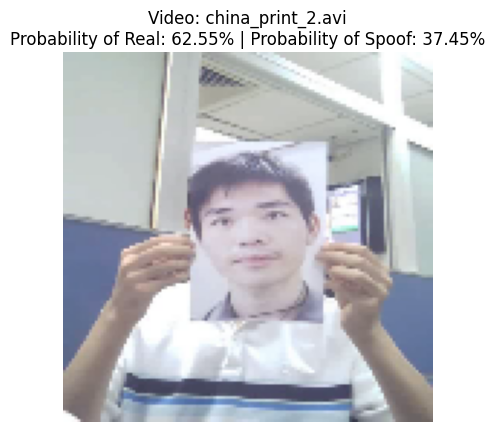

In [ ]:
# Display each image with its prediction probability
for video_name, frame, prediction in zip(video_names, test_data, predictions):
    # Convert the frame from normalized array back to an image
    frame = (frame * 255).astype("uint8")
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Calculate probabilities
    prob_real = prediction[0] * 100
    prob_spoof = (1 - prediction[0]) * 100

    # Display the image
    plt.imshow(frame)
    plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
    plt.axis('off')
    plt.show()


In [ ]:
import pandas as pd

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Video Name': video_names,
    'Probability of Being Real  (Model 1 -> CNN)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions],
    'Probability of Being Spoof (Model 1 -> CNN) (%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions]
})

# Display the DataFrame
results_df


,Video Name,Probability of Being Real (Model 1 -> CNN)(%),Probability of Being Spoof (Model 1 -> CNN) (%)
0,woman_real.mp4,99.96%,0.04%
1,china_print_1.avi,0.00%,100.00%
2,farzam_screen.mp4,0.09%,99.91%
3,armin_screen.mp4,2.02%,97.98%
4,woman_monitor.mp4,100.00%,0.00%
5,china_real_1.avi,99.71%,0.29%
6,woman_print.mp4,0.00%,100.00%
7,china_real_2.avi,0.01%,99.99%
8,armin_real.mp4,95.58%,4.42%
9,armin_print.mp4,99.82%,0.18%


FFT to CNN


In [ ]:
# Image preprocessing parameters
img_height, img_width = 128, 128

# Prepare the test data
test_data = []
video_names = []

for video_name, frame in middle_frames.items():
    # Resize the frame
    image = cv2.resize(frame, (img_height, img_width))
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Perform FFT
    f_transform = np.fft.fft2(gray_image)
    f_transform_shifted = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted) + 1)  # Added +1 to avoid log(0)
    # Normalize the magnitude spectrum
    magnitude_spectrum = (magnitude_spectrum - magnitude_spectrum.min()) / (magnitude_spectrum.max() - magnitude_spectrum.min())
    # Stack the magnitude spectrum to create a 3-channel image
    magnitude_spectrum_3ch = np.stack([magnitude_spectrum]*3, axis=-1)
    # Normalize the pixel values to [0, 1]
    magnitude_spectrum_3ch = magnitude_spectrum_3ch.astype("float32")
    test_data.append(magnitude_spectrum_3ch)
    video_names.append(video_name)

# Convert test data to numpy array
test_data = np.array(test_data, dtype="float32")

# Make predictions
predictions = model.predict(test_data)

# Interpret the predictions
for video_name, prediction in zip(video_names, predictions):
    label = "Spoof" if prediction[0] > 0.5 else "Real"
    print(f"Video: {video_name}, Prediction: {label} ({prediction[0]:.2f})")


1/1 [==============================] - 0s 21ms/step
Video: woman_real.mp4, Prediction: Real (0.00)
Video: china_print_1.avi, Prediction: Real (0.00)
Video: farzam_screen.mp4, Prediction: Real (0.00)
Video: armin_screen.mp4, Prediction: Real (0.00)
Video: woman_monitor.mp4, Prediction: Real (0.00)
Video: china_real_1.avi, Prediction: Real (0.00)
Video: woman_print.mp4, Prediction: Real (0.00)
Video: china_real_2.avi, Prediction: Real (0.01)
Video: armin_real.mp4, Prediction: Real (0.00)
Video: armin_print.mp4, Prediction: Real (0.00)
Video: farzam_print.mp4, Prediction: Real (0.00)
Video: farzam_real.mp4, Prediction: Real (0.00)
Video: china_print_2.avi, Prediction: Real (0.00)


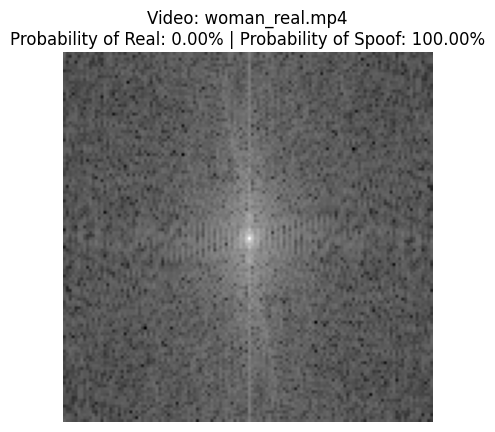

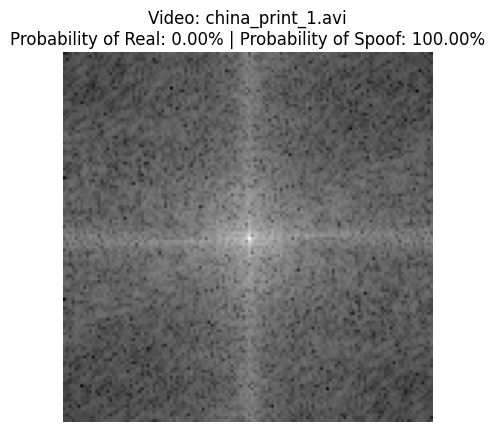

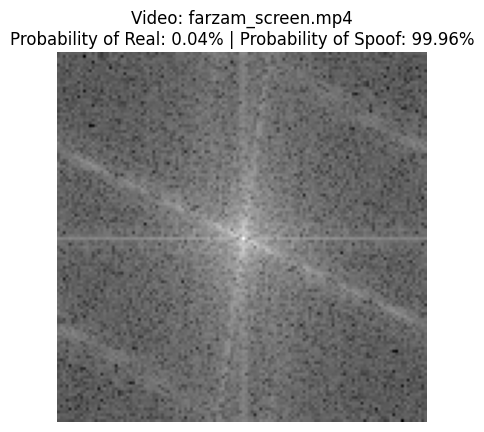

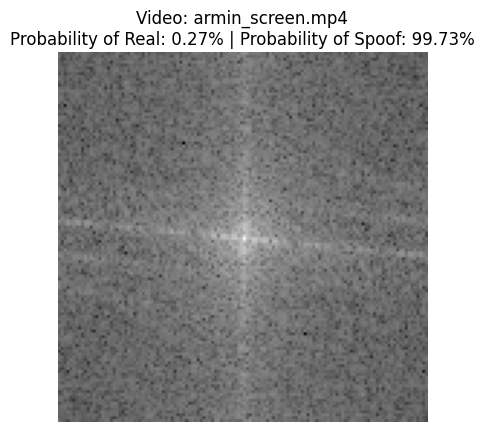

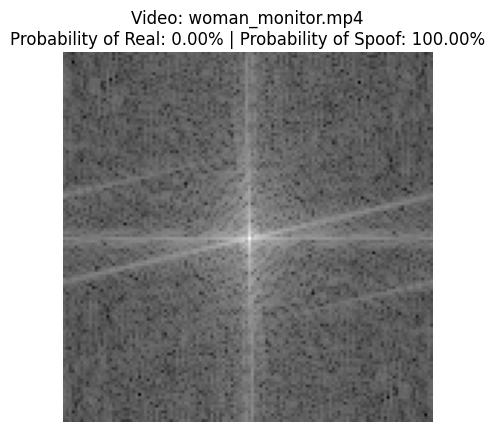

...

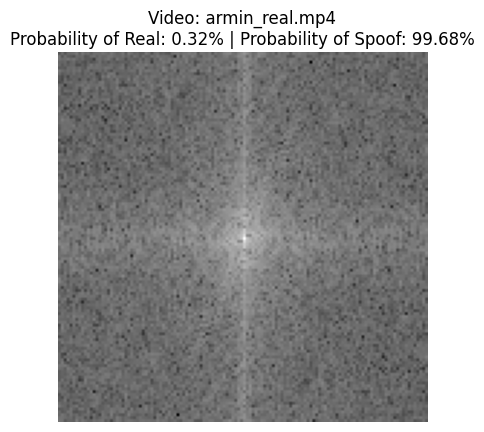

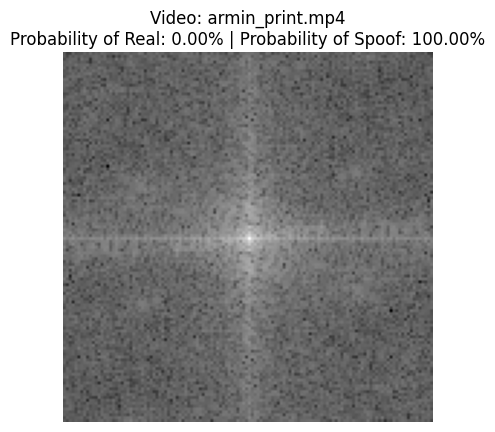

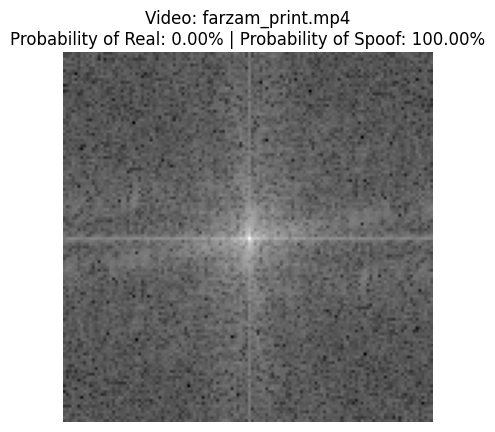

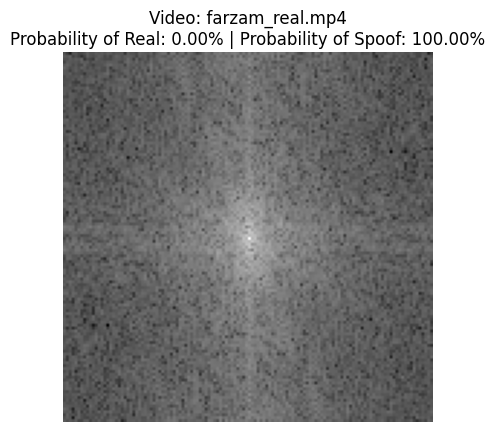

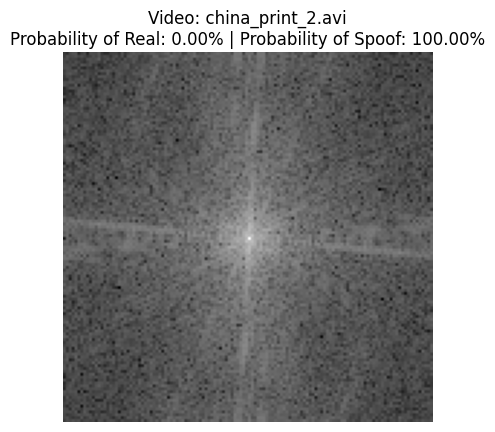

In [ ]:
# Display each image with its prediction probability
for video_name, frame, prediction in zip(video_names, test_data, predictions):
    # Convert the frame from normalized array back to an image
    frame = (frame * 255).astype("uint8")
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Calculate probabilities
    prob_real = prediction[0] * 100
    prob_spoof = (1 - prediction[0]) * 100

    # Display the image
    plt.imshow(frame)
    plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
    plt.axis('off')
    plt.show()


In [ ]:
import pandas as pd

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Video Name': video_names,
    'Probability of Being Real (FFT) (Model 1 -> CNN)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions],
    'Probability of Being Spoof (FFT) (Model 1 -> CNN) (%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions]
})

# Display the DataFrame
results_df


,Video Name,Probability of Being Real (FFT) (Model 1 -> CNN)(%),Probability of Being Spoof (FFT) (Model 1 -> CNN) (%)
0,woman_real.mp4,0.00%,100.00%
1,china_print_1.avi,0.00%,100.00%
2,farzam_screen.mp4,0.04%,99.96%
3,armin_screen.mp4,0.27%,99.73%
4,woman_monitor.mp4,0.00%,100.00%
5,china_real_1.avi,0.00%,100.00%
6,woman_print.mp4,0.02%,99.98%
7,china_real_2.avi,1.02%,98.98%
8,armin_real.mp4,0.32%,99.68%
9,armin_print.mp4,0.00%,100.00%


FFT and LBP


In [ ]:
# Load the trained model
model = load_model('/content/drive/MyDrive/Copy of model_Feature_Final.h5')
model.load_weights('/content/drive/MyDrive/Copy of weights_Feature_Final.h5')


In [ ]:
# Image preprocessing parameters
img_height, img_width = 128, 128

# Prepare the test data
test_data = []
video_names = []

def preprocess_image(image):
    # Resize the image
    image = cv2.resize(image, (img_height, img_width))
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # FFT
    f_transform = np.fft.fft2(gray_image)
    f_transform_shifted = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted) + 1)  # Added +1 to avoid log(0)

    # LBP
    radius = 3
    n_points = 8 * radius
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')

    # Stack FFT and LBP
    stacked_features = np.stack((magnitude_spectrum, lbp), axis=-1)

    return stacked_features


In [ ]:
# Preprocess and scale the test data
scaler = StandardScaler()

for video_name, frame in middle_frames.items():
    preprocessed_image = preprocess_image(frame)
    preprocessed_image_flattened = preprocessed_image.flatten().reshape(1, -1)
    scaled_image = scaler.fit_transform(preprocessed_image_flattened)
    scaled_image_reshaped = scaled_image.reshape((img_height, img_width, 2))
    test_data.append(scaled_image_reshaped)
    video_names.append(video_name)

# Convert test data to numpy array
test_data = np.array(test_data, dtype="float32")

# Make predictions
predictions = model.predict(test_data)

# Interpret the predictions
for video_name, prediction in zip(video_names, predictions):
    label = "Spoof" if prediction[0] > 0.5 else "Real"
    print(f"Video: {video_name}, Prediction: {label} ({prediction[0]:.2f})")

1/1 [==============================] - 2s 2s/step
Video: woman_real.mp4, Prediction: Real (0.38)
Video: china_print_1.avi, Prediction: Real (0.38)
Video: farzam_screen.mp4, Prediction: Real (0.38)
Video: armin_screen.mp4, Prediction: Real (0.38)
Video: woman_monitor.mp4, Prediction: Real (0.38)
Video: china_real_1.avi, Prediction: Real (0.38)
Video: woman_print.mp4, Prediction: Real (0.38)
Video: china_real_2.avi, Prediction: Real (0.38)
Video: armin_real.mp4, Prediction: Real (0.38)
Video: armin_print.mp4, Prediction: Real (0.38)
Video: farzam_print.mp4, Prediction: Real (0.38)
Video: farzam_real.mp4, Prediction: Real (0.38)
Video: china_print_2.avi, Prediction: Real (0.38)


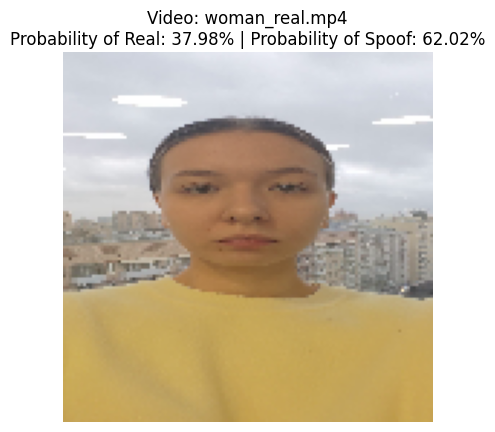

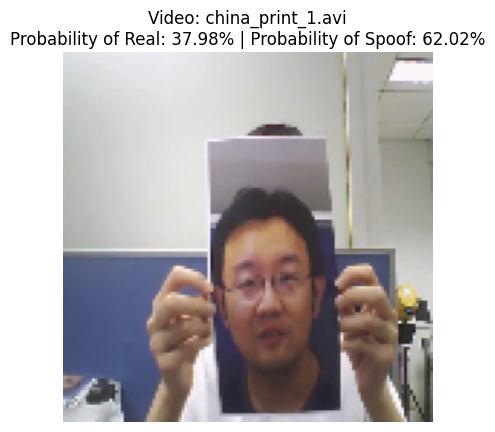

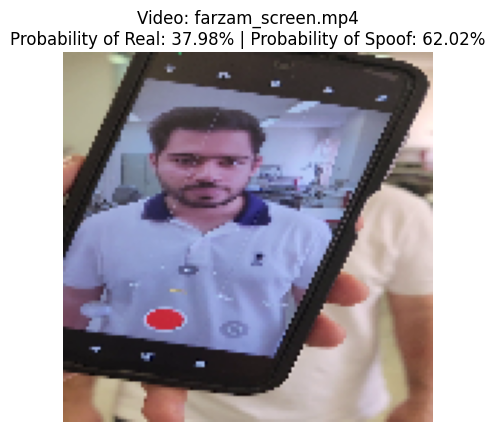

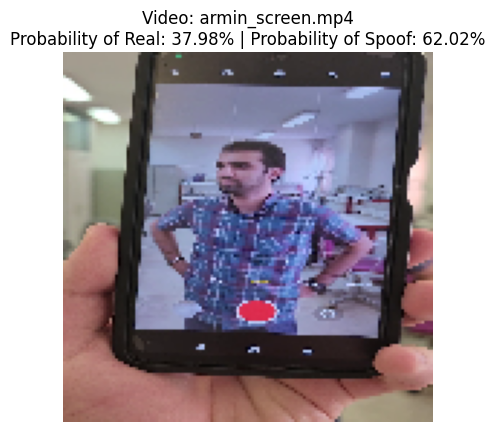

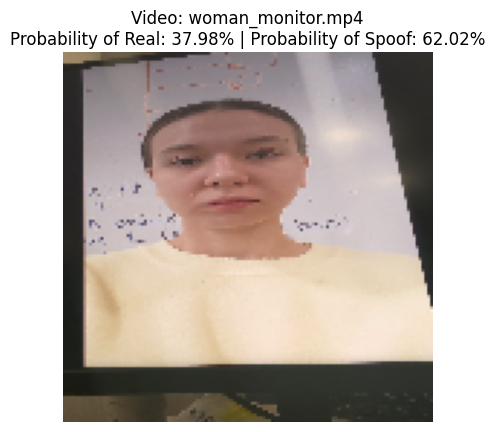

...

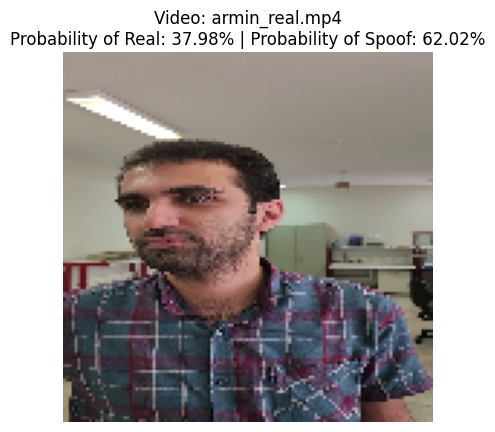

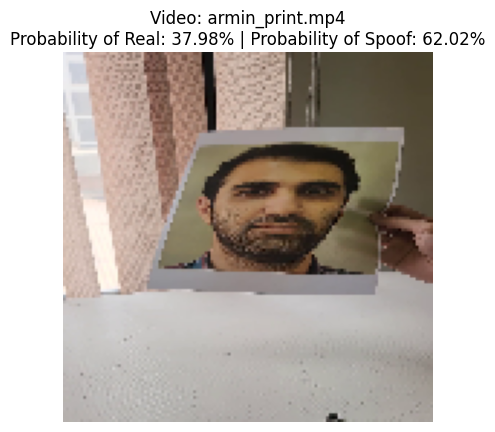

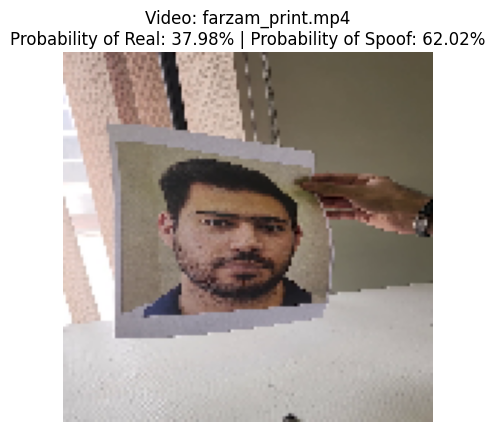

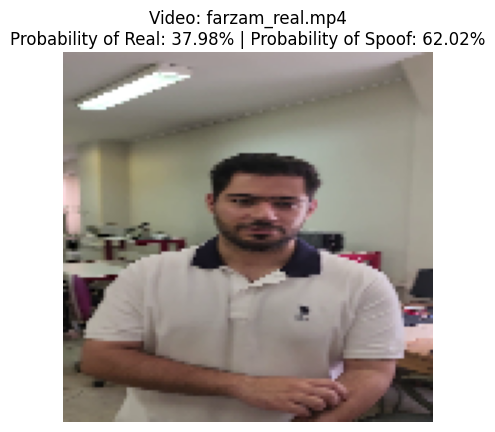

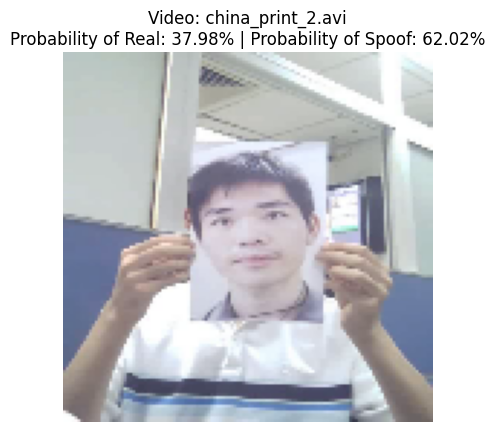

In [ ]:
import matplotlib.pyplot as plt

# Display each image with its prediction probability
for video_name, frame, prediction in zip(video_names, middle_frames.values(), predictions):
    # Resize the frame to the size used during training
    frame = cv2.resize(frame, (img_height, img_width))

    # Normalize the frame for visualization
    frame = (frame.astype("float32") / 255.0)

    # Calculate probabilities
    prob_real = prediction[0] * 100
    prob_spoof = (1 - prediction[0]) * 100

    # Display the image
    plt.imshow(cv2.cvtColor((frame * 255).astype("uint8"), cv2.COLOR_BGR2RGB))
    plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
    plt.axis('off')
    plt.show()


In [ ]:
# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Video Name': video_names,
    'Probability of Being Real (Model 1 -> CNN)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions],
    'Probability of Being Spoof (Model 1 -> CNN)(%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions]
})

# Display the DataFrame
results_df

,Video Name,Probability of Being Real (Model 1 -> CNN)(%),Probability of Being Spoof (Model 1 -> CNN)(%)
0,woman_real.mp4,37.98%,62.02%
1,china_print_1.avi,37.98%,62.02%
2,farzam_screen.mp4,37.98%,62.02%
3,armin_screen.mp4,37.98%,62.02%
4,woman_monitor.mp4,37.98%,62.02%
5,china_real_1.avi,37.98%,62.02%
6,woman_print.mp4,37.98%,62.02%
7,china_real_2.avi,37.98%,62.02%
8,armin_real.mp4,37.98%,62.02%
9,armin_print.mp4,37.98%,62.02%


Found 13 video files.
Processing video file: woman_real.mp4
Total frames in video woman_real.mp4: 51
Middle frame extracted for video woman_real.mp4
Processing video file: china_print_1.avi
Total frames in video china_print_1.avi: 217
Middle frame extracted for video china_print_1.avi
Processing video file: farzam_screen.mp4
Total frames in video farzam_screen.mp4: 326
Middle frame extracted for video farzam_screen.mp4
Processing video file: armin_screen.mp4
Total frames in video armin_screen.mp4: 187
Middle frame extracted for video armin_screen.mp4
Processing video file: woman_monitor.mp4
Total frames in video woman_monitor.mp4: 36
Middle frame extracted for video woman_monitor.mp4
Processing video file: china_real_1.avi
Total frames in video china_real_1.avi: 158
Middle frame extracted for video china_real_1.avi
Processing video file: woman_print.mp4
Total frames in video woman_print.mp4: 37
Middle frame extracted for video woman_print.mp4
Processing video file: china_real_2.avi
Tot

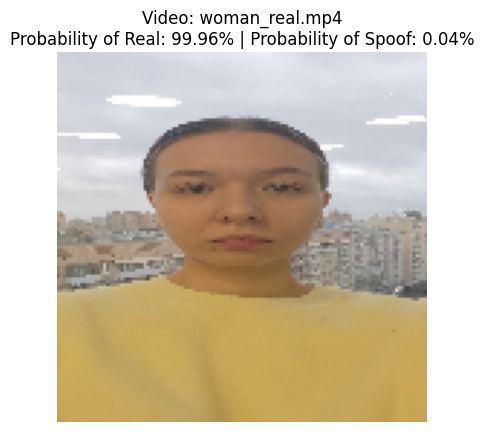

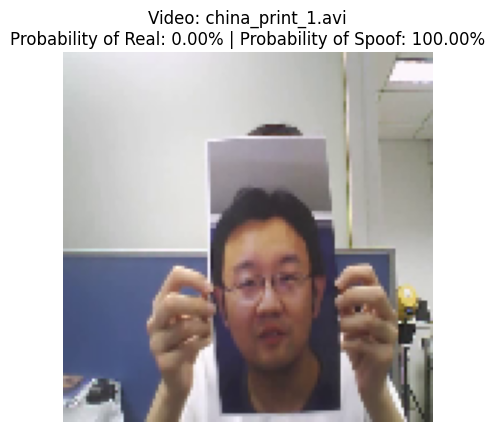

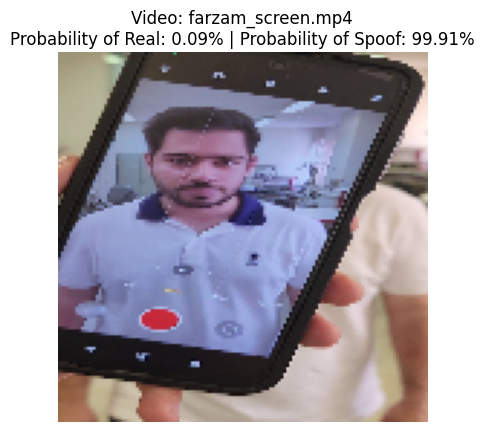

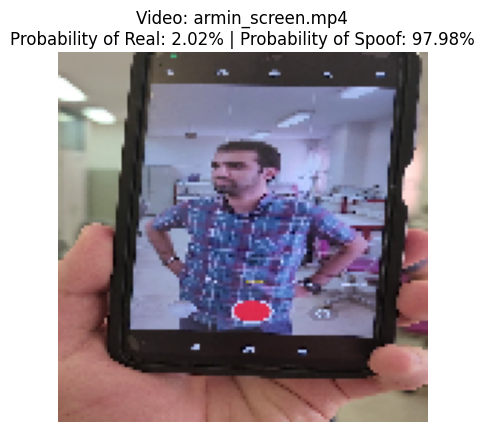

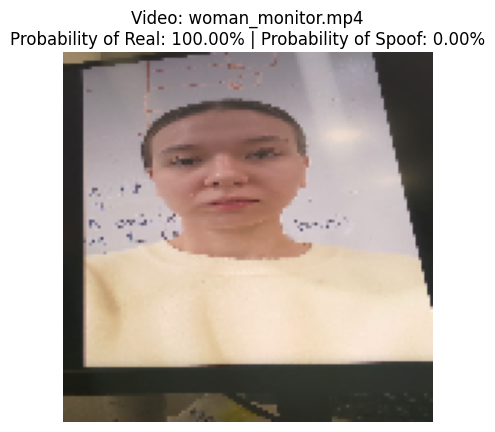

...

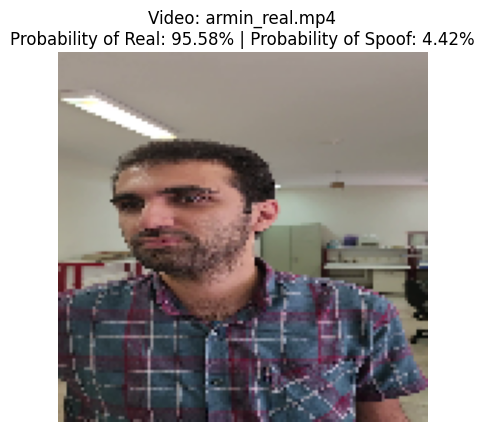

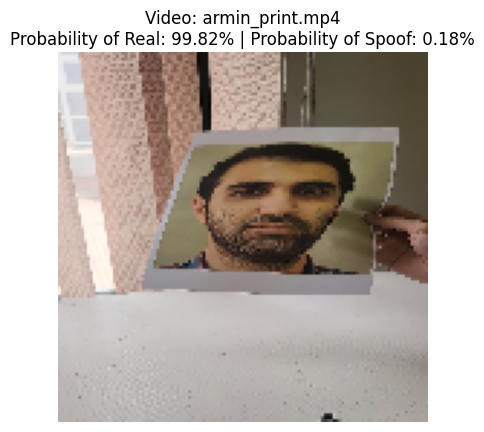

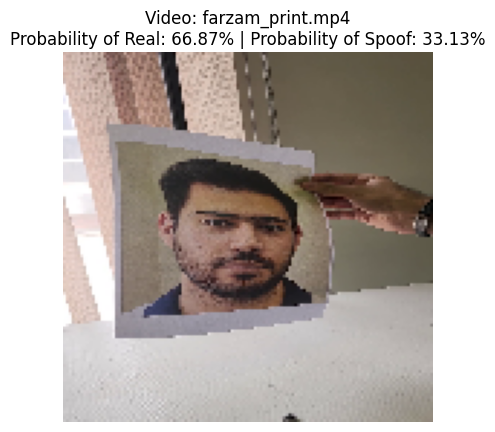

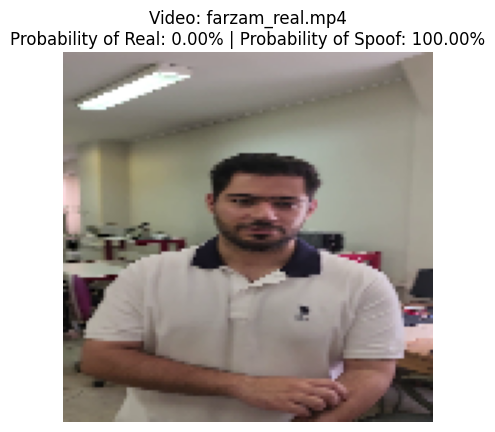

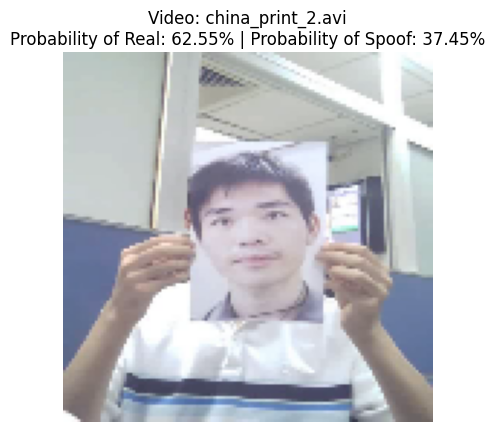

1/1 [==============================] - 0s 169ms/step


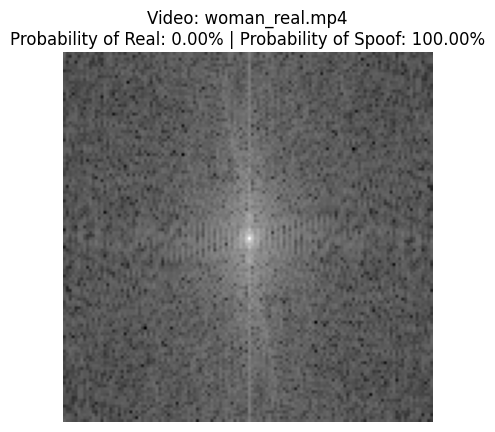

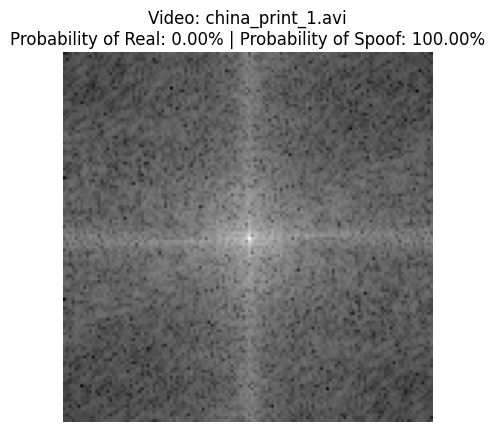

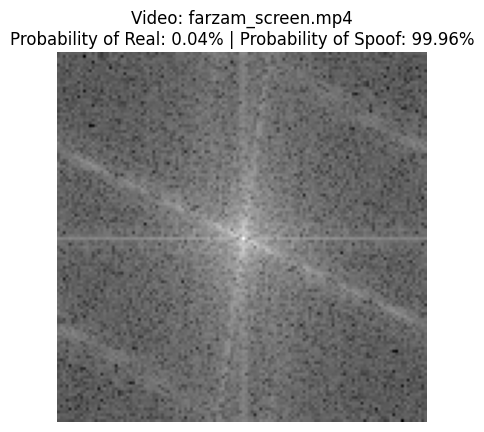

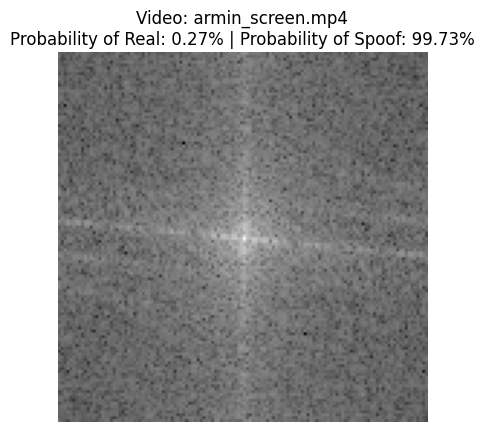

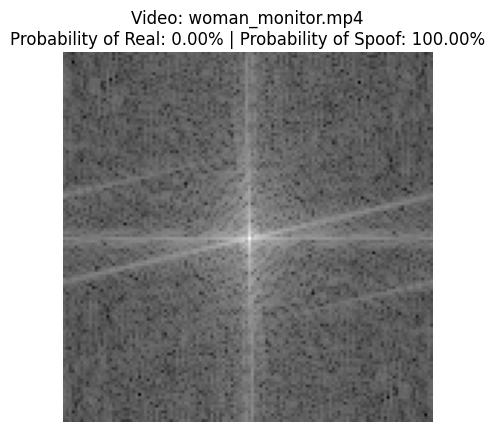

...

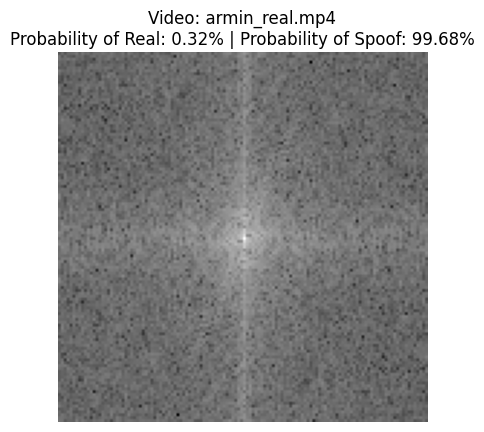

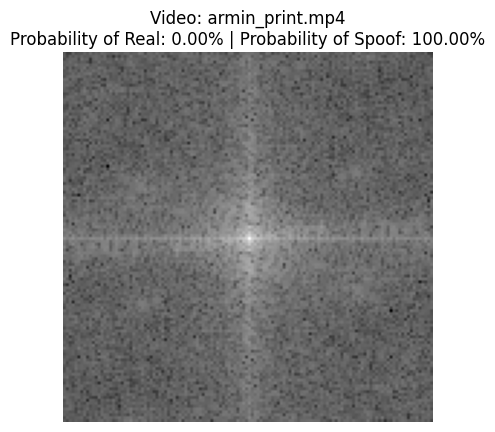

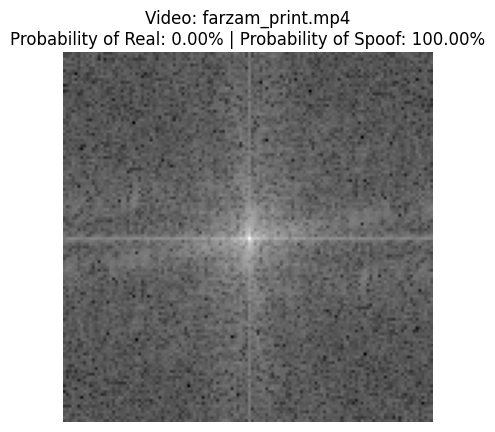

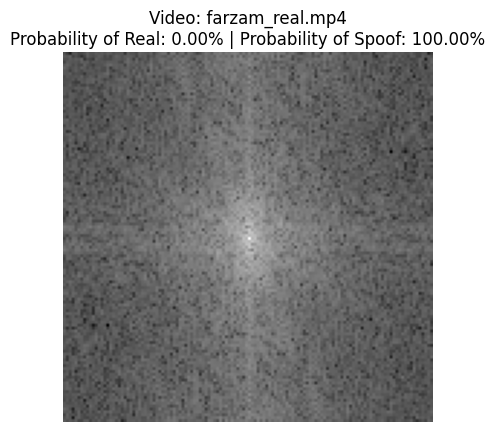

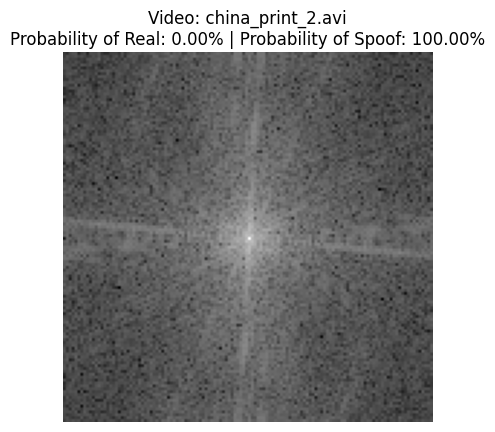

1/1 [==============================] - 0s 77ms/step


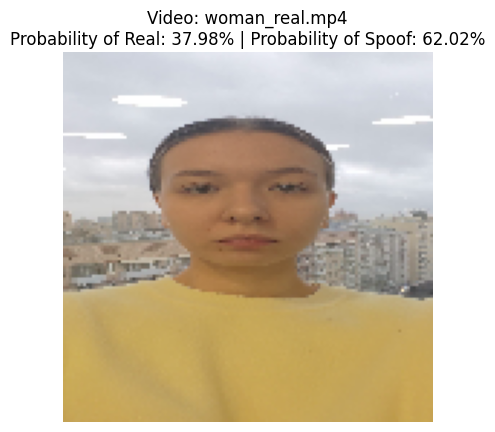

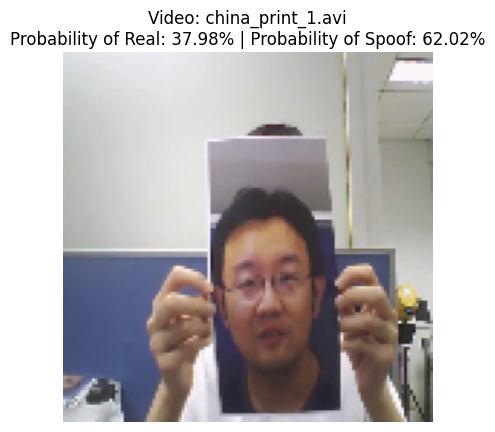

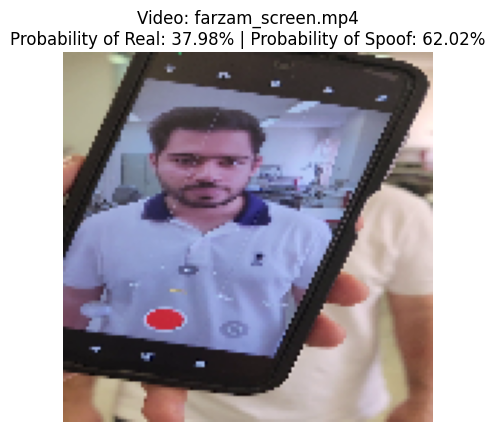

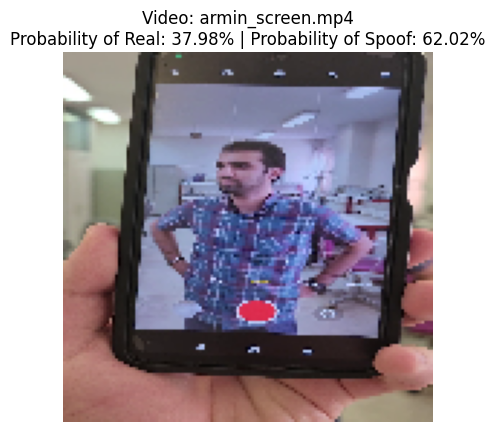

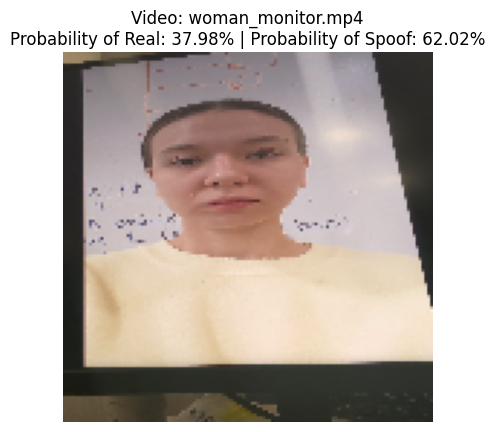

...

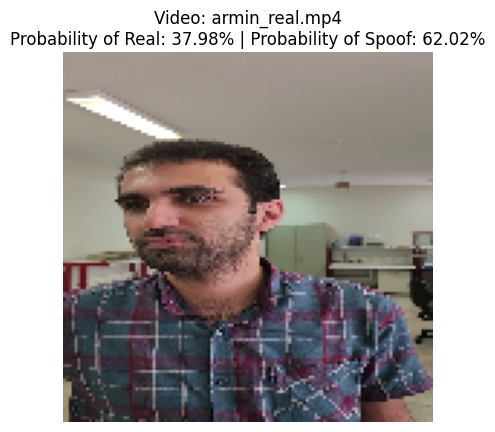

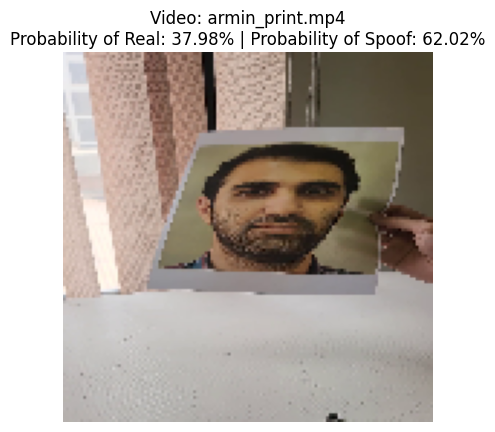

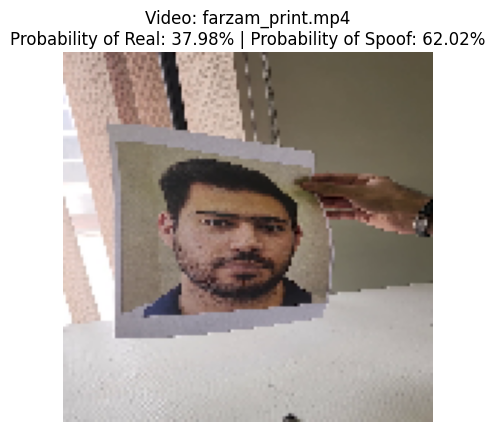

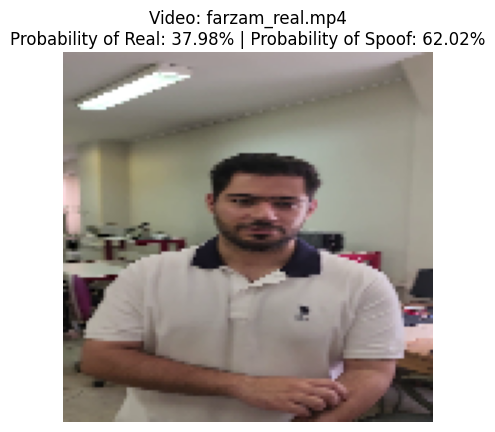

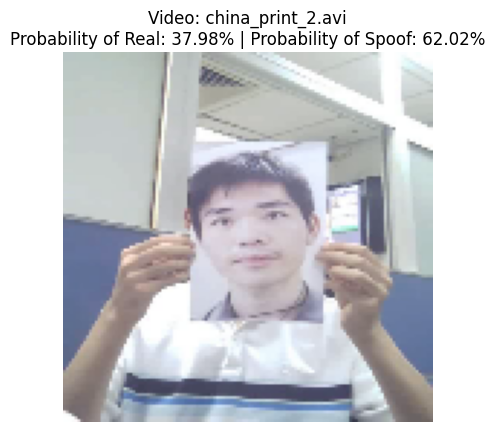

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from numpy.fft import fft2, fftshift
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import StandardScaler

def preprocess_image_fft(image, img_height, img_width):
    # Resize the image
    image = cv2.resize(image, (img_height, img_width))
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Perform FFT
    f_transform = np.fft.fft2(gray_image)
    f_transform_shifted = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted) + 1)  # Added +1 to avoid log(0)
    # Normalize the magnitude spectrum
    magnitude_spectrum = (magnitude_spectrum - magnitude_spectrum.min()) / (magnitude_spectrum.max() - magnitude_spectrum.min())
    # Stack the magnitude spectrum to create a 3-channel image
    magnitude_spectrum_3ch = np.stack([magnitude_spectrum]*3, axis=-1)
    return magnitude_spectrum_3ch.astype("float32")

def preprocess_image_fft_lbp(image, img_height, img_width):
    # Resize the image
    image = cv2.resize(image, (img_height, img_width))
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # FFT
    f_transform = np.fft.fft2(gray_image)
    f_transform_shifted = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted) + 1)  # Added +1 to avoid log(0)

    # LBP
    radius = 3
    n_points = 8 * radius
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')

    # Stack FFT and LBP
    stacked_features = np.stack((magnitude_spectrum, lbp), axis=-1)

    return stacked_features

def main():
    # Directory containing the videos
    video_dir = '/content/video_test/video test'

    # Dictionary to store the middle frames
    middle_frames = {}

    # List all video files in the directory
    video_files = [f for f in os.listdir(video_dir) if os.path.isfile(os.path.join(video_dir, f)) and (f.endswith('.mp4') or f.endswith('.avi'))]
    print(f"Found {len(video_files)} video files.")

    for video_file in video_files:
        print(f"Processing video file: {video_file}")
        video_path = os.path.join(video_dir, video_file)

        # Capture the video
        cap = cv2.VideoCapture(video_path)

        # Check if video opened successfully
        if not cap.isOpened():
            print(f"Error opening video file: {video_file}")
            continue

        # Get total number of frames
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Total frames in video {video_file}: {total_frames}")

        # Calculate the middle frame index
        if total_frames > 0:
            middle_frame_idx = total_frames // 2
        else:
            print(f"Skipping video {video_file} due to zero frames.")
            continue

        # Set the video to the middle frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame_idx)

        # Read the middle frame
        ret, frame = cap.read()

        if ret:
            # Store the frame in the dictionary
            middle_frames[video_file] = frame
            print(f"Middle frame extracted for video {video_file}")
        else:
            print(f"Could not read frame from {video_file}")

        # Release the video capture object
        cap.release()

    # Image preprocessing parameters
    img_height, img_width = 128, 128

    # CNN Model
    model_cnn = load_model('/content/drive/MyDrive/model_1_Final.h5')
    model_cnn.load_weights('/content/drive/MyDrive/weights_1_Final.h5')

    # Prepare the test data for CNN
    test_data_cnn = []
    video_names = []

    for video_name, frame in middle_frames.items():
        # Resize the frame
        image = cv2.resize(frame, (img_height, img_width))
        # Convert the image to array
        image = img_to_array(image)
        # Normalize the pixel values to [0, 1]
        image = image.astype("float32") / 255.0
        test_data_cnn.append(image)
        video_names.append(video_name)

    # Convert test data to numpy array
    test_data_cnn = np.array(test_data_cnn, dtype="float32")

    # Make predictions with CNN model
    predictions_cnn = model_cnn.predict(test_data_cnn)

    # Display each image with its prediction probability for CNN model
    for video_name, frame, prediction in zip(video_names, test_data_cnn, predictions_cnn):
        # Convert the frame from normalized array back to an image
        frame = (frame * 255).astype("uint8")
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Calculate probabilities
        prob_real = prediction[0] * 100
        prob_spoof = (1 - prediction[0]) * 100

        # Display the image
        plt.imshow(frame)
        plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
        plt.axis('off')
        plt.show()

    # Create a DataFrame to store the results for CNN model
    results_df_cnn = pd.DataFrame({
        'Video Name': video_names,
        'Probability of Being Real  (Model 1 -> CNN)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions_cnn],
        'Probability of Being Spoof (Model 1 -> CNN)(%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions_cnn]
    })

    # Save the DataFrame to CSV for CNN model
    results_df_cnn.to_csv('/content/results_model1_cnn.csv', index=False)

    # CNN Model with FFT as input
    model_fft = load_model('/content/drive/MyDrive/model_1_Final.h5')
    model_fft.load_weights('/content/drive/MyDrive/weights_1_Final.h5')

    # Prepare the test data for CNN with FFT
    test_data_fft = []

    for video_name, frame in middle_frames.items():
        magnitude_spectrum_3ch = preprocess_image_fft(frame, img_height, img_width)
        test_data_fft.append(magnitude_spectrum_3ch)

    # Convert test data to numpy array
    test_data_fft = np.array(test_data_fft, dtype="float32")

    # Make predictions with CNN model with FFT
    predictions_fft = model_fft.predict(test_data_fft)

    # Display each image with its prediction probability for CNN model with FFT
    for video_name, frame, prediction in zip(video_names, test_data_fft, predictions_fft):
        # Convert the frame from normalized array back to an image
        frame = (frame * 255).astype("uint8")
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Calculate probabilities
        prob_real = prediction[0] * 100
        prob_spoof = (1 - prediction[0]) * 100

        # Display the image
        plt.imshow(frame)
        plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
        plt.axis('off')
        plt.show()

    # Create a DataFrame to store the results for CNN model with FFT
    results_df_fft = pd.DataFrame({
        'Video Name': video_names,
        'Probability of Being Real (Model 2 -> FFT & CNN)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions_fft],
        'Probability of Being Spoof (Model 2 -> FFT & CNN)(%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions_fft]
    })

    # Save the DataFrame to CSV for CNN model with FFT
    results_df_fft.to_csv('/content/results_model2_fft.csv', index=False)

    # Model with FFT and LBP
    model_fft_lbp = load_model('/content/drive/MyDrive/Copy of model_Feature_Final.h5')
    model_fft_lbp.load_weights('/content/drive/MyDrive/Copy of weights_Feature_Final.h5')

    # Prepare the test data for model with FFT and LBP
    test_data_fft_lbp = []
    scaler = StandardScaler()

    for video_name, frame in middle_frames.items():
        preprocessed_image = preprocess_image_fft_lbp(frame, img_height, img_width)
        preprocessed_image_flattened = preprocessed_image.flatten().reshape(1, -1)
        scaled_image = scaler.fit_transform(preprocessed_image_flattened)
        scaled_image_reshaped = scaled_image.reshape((img_height, img_width, 2))
        test_data_fft_lbp.append(scaled_image_reshaped)

    # Convert test data to numpy array
    test_data_fft_lbp = np.array(test_data_fft_lbp, dtype="float32")

    # Make predictions with model using FFT and LBP
    predictions_fft_lbp = model_fft_lbp.predict(test_data_fft_lbp)

    # Display each image with its prediction probability for model with FFT and LBP
    for video_name, frame, prediction in zip(video_names, middle_frames.values(), predictions_fft_lbp):
        # Resize the frame to the size used during training
        frame = cv2.resize(frame, (img_height, img_width))

        # Normalize the frame for visualization
        frame = (frame.astype("float32") / 255.0)

        # Calculate probabilities
        prob_real = prediction[0] * 100
        prob_spoof = (1 - prediction[0]) * 100

        # Display the image
        plt.imshow(cv2.cvtColor((frame * 255).astype("uint8"), cv2.COLOR_BGR2RGB))
        plt.title(f"Video: {video_name}\nProbability of Real: {prob_real:.2f}% | Probability of Spoof: {prob_spoof:.2f}%")
        plt.axis('off')
        plt.show()

    # Create a DataFrame to store the results for model with FFT and LBP
    results_df_fft_lbp = pd.DataFrame({
        'Video Name': video_names,
        'Probability of Being Real (Model 3 -> FFT & LBP)(%)': [f"{pred[0] * 100:.2f}%" for pred in predictions_fft_lbp],
        'Probability of Being Spoof (Model 3 -> FFT & LBP)(%)': [f"{(1 - pred[0]) * 100:.2f}%" for pred in predictions_fft_lbp]
    })

    # Save the DataFrame to CSV for model with FFT and LBP
    results_df_fft_lbp.to_csv('/content/results_model3_fft_lbp.csv', index=False)

# Run the main function
if __name__ == "__main__":
    main()


In [ ]:
!pip install deepface


In [ ]:
import cv2
import os
from deepface import DeepFace

# Function to detect and crop face using DeepFace with SSD backend
def extract_faces_from_frame(frame, output_dir, video_name, frame_count):
    try:
        # Use SSD backend for faster detection
        faces = DeepFace.extract_faces(img_path=frame, detector_backend='ssd')

        if faces:
            video_folder = os.path.join(output_dir, video_name)
            os.makedirs(video_folder, exist_ok=True)

            for face_idx, face in enumerate(faces):
                x, y, w, h = face["facial_area"]["x"], face["facial_area"]["y"], face["facial_area"]["w"], face["facial_area"]["h"]

                # Crop the face using the bounding box coordinates
                cropped_face = frame[y:y+h, x:x+w]

                # Ensure the face image is in BGR format (OpenCV's default)
                if len(cropped_face.shape) == 3 and cropped_face.shape[2] == 4:
                    cropped_face = cv2.cvtColor(cropped_face, cv2.COLOR_BGRA2BGR)

                # Save the cropped face image to the video subfolder
                face_file = os.path.join(video_folder, f"frame{frame_count}_face{face_idx + 1}.jpg")
                cv2.imwrite(face_file, cropped_face)
        else:
            print(f"No faces detected in frame {frame_count}.")

    except Exception as e:
        print(f"Face extraction failed: {e}")

# Directory containing videos
video_dir = "/content/video_test"
output_dir = "/content/cropped_faces_all_0"

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Process each video file in the directory
for video_file in os.listdir(video_dir):
    if video_file.endswith((".mp4", ".avi", ".mov")):  # Add more video file extensions if needed
        video_path = os.path.join(video_dir, video_file)
        video_name = os.path.splitext(video_file)[0]

        # Create a VideoCapture object
        cap = cv2.VideoCapture(video_path)

        frame_count = 0
        stride = 10  # Adjust the stride value as needed

        while True:
            ret, frame = cap.read()
            if not ret:
                break

            frame_count += 1

            if frame_count % stride != 0:  # Apply stride
                continue

            # Extract faces from the frame using SSD and save them
            extract_faces_from_frame(frame, output_dir, video_name, frame_count)

        cap.release()

print("Face extraction and cropping completed using SSD.")


Face extraction and cropping completed using SSD.


In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Function to preprocess the frame with padding to maintain aspect ratio
def preprocess_frame(frame, target_size=(150, 150)):
    # Resize while maintaining aspect ratio
    h, w = frame.shape[:2]
    ratio = min(target_size[0] / w, target_size[1] / h)
    resized_w = int(np.round(w * ratio))
    resized_h = int(np.round(h * ratio))

    # Resize image with padding
    resized_image = cv2.resize(frame, (resized_w, resized_h))

    # Create padded canvas
    padded_image = np.zeros((target_size[1], target_size[0], 3), dtype=np.uint8)

    # Calculate coordinates for placing the resized image in the padded canvas
    start_x = (target_size[0] - resized_w) // 2
    start_y = (target_size[1] - resized_h) // 2
    end_x = start_x + resized_w
    end_y = start_y + resized_h

    # Place resized image into padded canvas
    padded_image[start_y:end_y, start_x:end_x, :] = resized_image

    # Normalize
    padded_image = padded_image.astype(np.float32) / 255.0

    # Expand dimensions for model input
    padded_image = np.expand_dims(padded_image, axis=0)

    return padded_image

# Function to compute liveness scores for all images in a folder
def compute_liveness_scores(images_folder, model):
    liveness_scores = []
    for image_name in os.listdir(images_folder):
        image_path = os.path.join(images_folder, image_name)
        image = cv2.imread(image_path)
        preprocessed_image = preprocess_frame(image)
        liveness_score = model.predict(preprocessed_image)[0][0]
        liveness_scores.append(liveness_score)
    return liveness_scores

# Path to the main directory containing subfolders of cropped faces
main_directory = '/content/cropped_faces_all_0'

# Load your pre-trained model
#model = load_model('path_to_your_model.h5')  # Replace with your actual model path

# Dictionary to store results
results = {}

# Iterate through each subfolder
subfolders = os.listdir(main_directory)
for folder_name in subfolders:
    folder_path = os.path.join(main_directory, folder_name)
    if os.path.isdir(folder_path):
        liveness_scores = compute_liveness_scores(folder_path, model)
        results[folder_name] = liveness_scores

# Print results
for folder_name, scores in results.items():
    print(f"Folder: {folder_name}, Liveness Scores: {scores}")


1/1 [==============================] - 0s 17ms/step
Folder: monitor_woman_3, Liveness Scores: [1.0, 1.0, 1.0, 1.0, 1.0]
Folder: real_woman_2, Liveness Scores: [1.0, 1.0, 1.0]
Folder: monitor_man, Liveness Scores: [1.0, 1.0, 1.0]
Folder: real_woman_3, Liveness Scores: [1.0, 1.0, 1.0]
Folder: print_woman_1, Liveness Scores: [1.0, 1.0, 1.0]
Folder: real_woman, Liveness Scores: [1.0, 1.0, 1.0, 1.0, 1.0]
Folder: monitor_woman_2, Liveness Scores: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Folder: monitor_woman, Liveness Scores: [1.0, 1.0, 1.0]
Folder: monitor_man_2, Liveness Scores: [1.0, 1.0, 1.0]
Folder: print_woman_2, Liveness Scores: [1.0, 1.0]
Folder: real_man_2, Liveness Scores: [1.0, 1.0, 1.0, 1.0]
Folder: real_man, Liveness Scores: [1.0, 1.0, 1.0, 1.0, 1.0]


In [ ]:

prediction = model.predict(preprocessed_frame)